In [25]:
!pip install seaborn
!pip install missingno
!pip install sklearn

In [26]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import missingno as msno
from PIL import Image

In [27]:
train_df = pd.read_csv('../P1/train/train/train.csv', index_col='id')

In [28]:
train_df.sample(10)

,gender,race,age,path
id,,,,
000695,female,Asian,53,000695_female_Asian_53
006200,male,Asian,18,006200_male_Asian_18
003036,female,Asian,19,003036_female_Asian_19
001772,male,Asian,57,001772_male_Asian_57
005278,male,Asian,22,005278_male_Asian_22
006722,male,Asian,19,006722_male_Asian_19
003106,female,Asian,20,003106_female_Asian_20
001779,female,Asian,53,001779_female_Asian_53
001245,female,Asian,23,001245_female_Asian_23


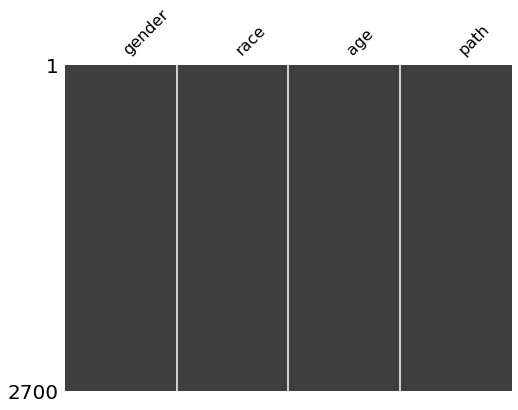

In [29]:
f, ax = plt.subplots(1,1, figsize=(8, 6))

msno.matrix(train_df, ax=ax, sparkline=False)

plt.show()

In [30]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2700 entries, 000001 to 006959
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   gender  2700 non-null   object
 1   race    2700 non-null   object
 2   age     2700 non-null   int64 
 3   path    2700 non-null   object
dtypes: int64(1), object(3)
memory usage: 105.5+ KB


In [31]:
# train_df.describe()

In [32]:
train_df['race'].unique()

array(['Asian'], dtype=object)

In [48]:
train_df['gender'].unique()

array(['female', 'male'], dtype=object)

In [34]:
train_df.groupby('gender').count()

,race,age,path
gender,,,
female,1658,1658,1658
male,1042,1042,1042


# 자료의 불균일성

In [35]:
print('age under 30')
print(train_df[train_df.age < 30].groupby('gender').size())
print('\n'+'age under 60')
print(train_df[(train_df.age>=30) & (train_df.age<60)].groupby('gender').size())
print('\n'+'age over 60')
print(train_df[train_df.age >= 60].groupby('gender').size())

age under 30
gender
female    732
male      549
dtype: int64

age under 60
gender
female    817
male      410
dtype: int64

age over 60
gender
female    109
male       83
dtype: int64


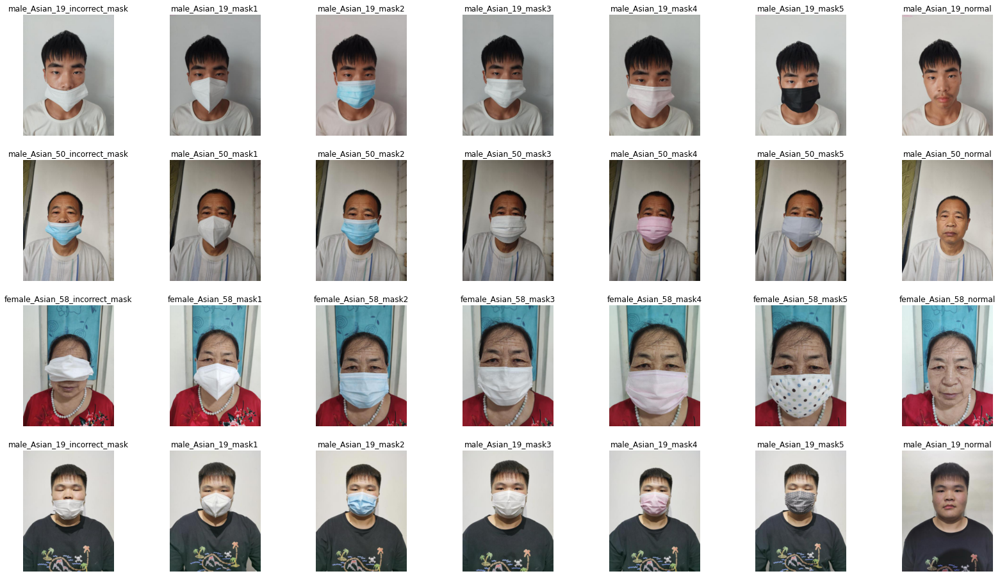

In [36]:
random_images = np.random.permutation(train_df.path)

fig, ax = plt.subplots(4, 7, figsize=(28, 16))
train_image = []

path = random_images[:4]
for k in range(4):
    for i,j in enumerate(['incorrect_mask','mask1','mask2','mask3','mask4','mask5','normal'], start=1):
        plt.subplot(4,7, k*7+i)
        plt.axis('off')
        ax[k, i-1].set_title(path[k][7:]+'_'+j)
        Image_file = Image.open('../P1/train/train/images/' + path[k] + '/' + j +'.jpg')
        plt.imshow(Image_file)
        
        train_image.append(Image_file)

plt.show()

In [37]:
image = train_image[0]
image = np.array(image)
image
print(image.shape)
print(image.min(), image.max())
print((image > 0).sum())

(512, 384, 3)
2 241
589824


## 확장자 명 jpg아닌 경우 있다.
 - png 파일 존재 (예: 006129_male_Asian_20)
 
## 라벨링 잘못된 것 있다.
 - 남잔데 여자라고 되어있음. (AI stage 토론방 참고)

# 주의할 유형

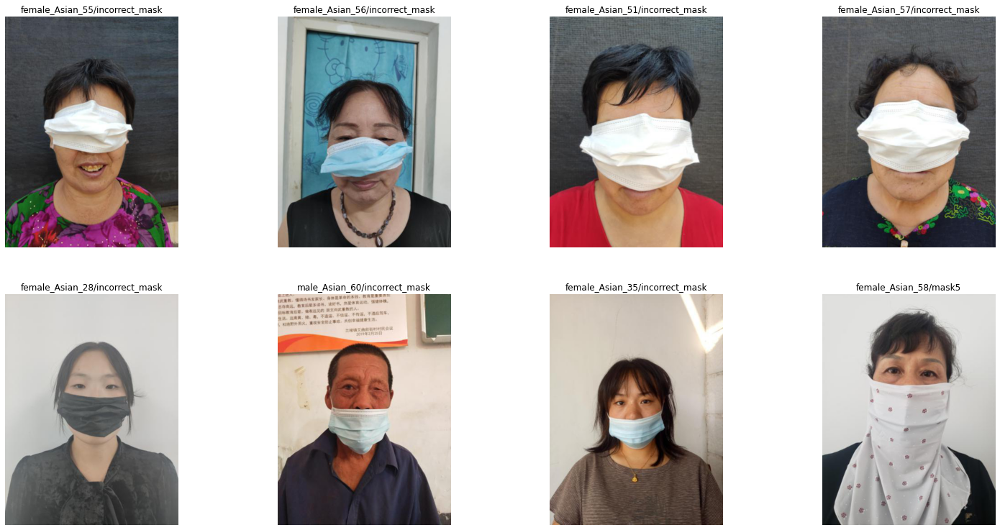

In [45]:
path_list = ['000301_female_Asian_55/incorrect_mask.jpg','000302_female_Asian_56/incorrect_mask.jpg','000304_female_Asian_51/incorrect_mask.jpg',
             '000312_female_Asian_57/incorrect_mask.jpg','004417_female_Asian_28/incorrect_mask.jpg',
            '004219_male_Asian_60/incorrect_mask.jpg','003889_female_Asian_35/incorrect_mask.jpg','005410_female_Asian_58/mask5.jpg']

fig, ax = plt.subplots(2, 4, figsize=(26, 13))
for i, path in enumerate(path_list):
    plt.subplot(2, 4, i+1)
    plt.axis('off')
    ax[i//4, i%4].set_title(path[7:-4])
    Image_file = Image.open('../P1/train/train/images/' + path)
    plt.imshow(Image_file)

# 50대와 60대의 사람을 어떻게 판별할 것인가?
https://m.blog.naver.com/PostView.naver?isHttpsRedirect=true&blogId=aksen85&logNo=140023682887 : 포토샵으로 나이든 모습 만들기
- 눈썹을 얇고 옅게
- 볼, 턱, 눈두덩이 처짐
- 이마, 눈가, 목주름
- 기미, 검버섯
- 얇아지는 입술

In [39]:
print('age over 50')
over_fifty = train_df[(train_df.age>=50) & (train_df.age<60)]
print('\n'+'age over 60')
over_sixty = train_df[train_df.age >= 60]

age over 50

age over 60


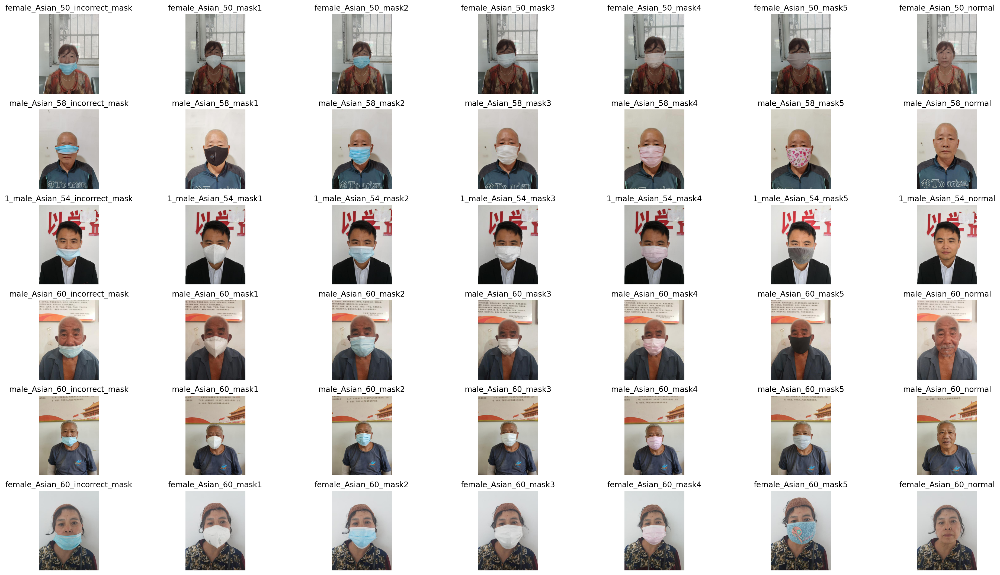

In [46]:
random_images1 = np.random.permutation(over_fifty)
random_images2 = np.random.permutation(over_sixty)

fig, ax = plt.subplots(6, 7, figsize=(28, 16), dpi=170)

path1 = random_images1[:3]
path2 = random_images2[:3]

for k in range(3):
    for i,j in enumerate(['incorrect_mask','mask1','mask2','mask3','mask4','mask5','normal'], start=1):
        plt.subplot(6,7, k*7+i)
        ax[k, i-1].axis('off')
        ax[k, i-1].set_title(path1[k][3][7:]+'_'+j)
        Image_file = Image.open('../P1/train/train/images/' + path1[k][3] + '/' + j +'.jpg')
        ax[k, i-1].imshow(Image_file)
        
        plt.subplot(6,7, k*7+i)
        ax[k+3, i-1].axis('off')
        ax[k+3, i-1].set_title(path2[k][3][7:]+'_'+j)
        Image_file = Image.open('../P1/train/train/images/' + path2[k][3] + '/' + j +'.jpg')
        ax[k+3, i-1].imshow(Image_file)

plt.show()

# R,G,B 채널 별로 확인해보자
- B 채널에서는 흰색 마스크와 사람 피부가 구별이 잘 된다. 하지만 검정 마스크와는 구별이 잘 안 간다.
- 검정마스크는 R 채널에서 구별이 잘 될 듯

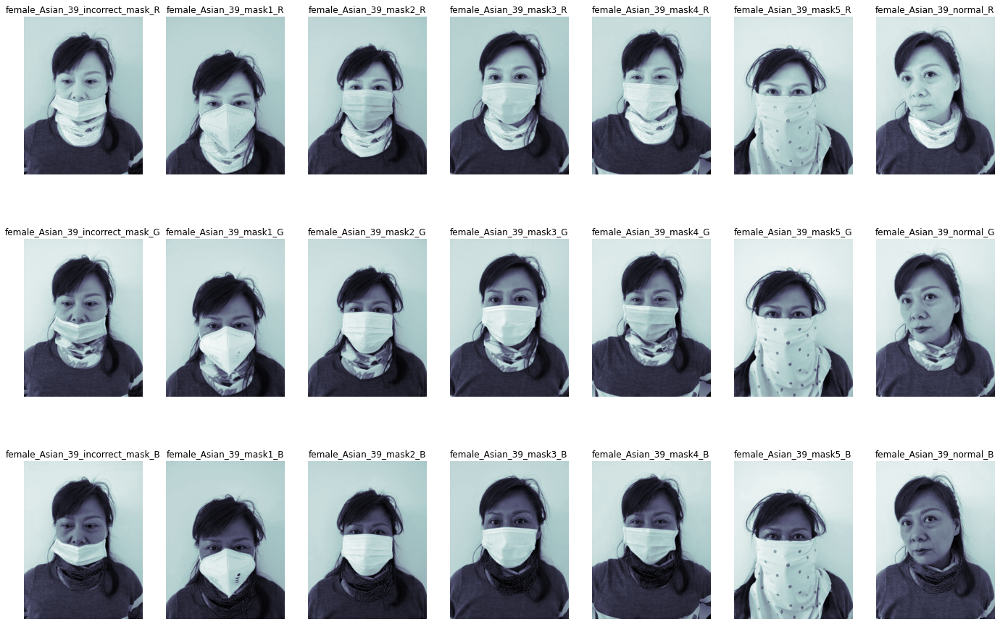

In [47]:
random_images = np.random.permutation(train_df.path)

fig, ax = plt.subplots(3, 7, figsize=(24, 16))

path = random_images[0]
color_name = ['R', 'G', 'B']
for k in range(3):
    for i,j in enumerate(['incorrect_mask','mask1','mask2','mask3','mask4','mask5','normal'], start=1):
        plt.subplot(3,7, k*7+i)
        ax[k, i-1].set_title(path[7:]+'_'+j+'_'+color_name[k])
        plt.axis('off')
        Image_file = Image.open('../P1/train/train/images/' + path + '/' + j +'.jpg')
        Image_file = np.array(Image_file)
        plt.imshow(Image_file[:,:,k], cmap=plt.cm.bone)


plt.show()

# 채널을 분리해서 보면 50대, 60대를 구분할 수 있을까?
- 나이 들 수록 B 채널에서 더욱 검게 보일까? -> 딱히..

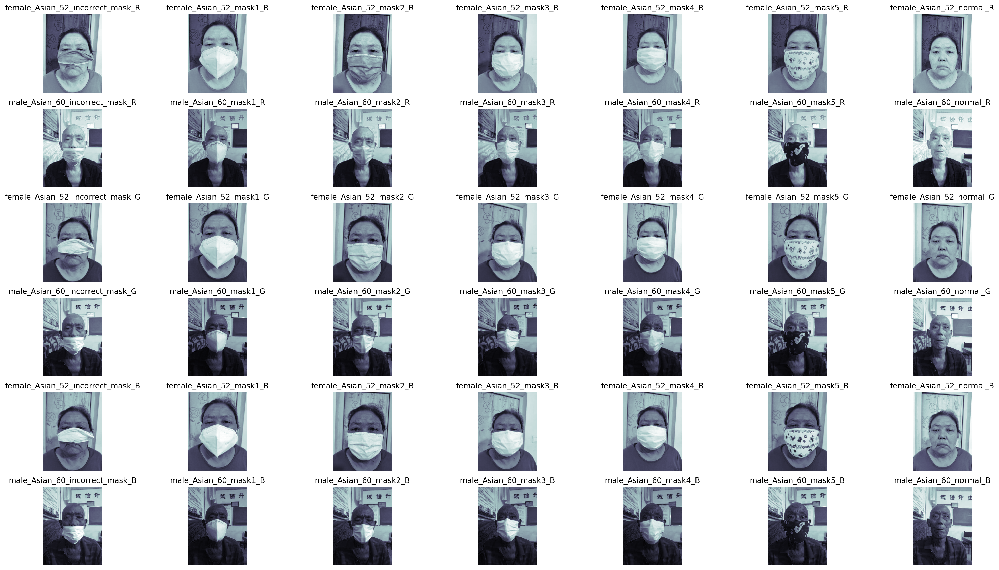

In [42]:
path1 = np.random.permutation(over_fifty)[0]
path2 = np.random.permutation(over_sixty)[0]
color_name = ['R', 'G', 'B']

fig, ax = plt.subplots(6, 7, figsize=(28, 16), dpi=180)

for k in range(3):
    for i,j in enumerate(['incorrect_mask','mask1','mask2','mask3','mask4','mask5','normal'], start=1):
        plt.subplot(6,7, k*7+i)
        ax[2*k, i-1].axis('off')
        ax[2*k, i-1].set_title(path1[3][7:]+'_'+j+'_'+color_name[k])
        Image_file = Image.open('../P1/train/train/images/' + path1[3] + '/' + j +'.jpg')
        Image_file = np.array(Image_file)
        ax[2*k, i-1].imshow(Image_file[:,:,k], cmap=plt.cm.bone)
        
        plt.subplot(6,7, (k+1)*7+i)
        ax[2*k+1, i-1].axis('off')
        ax[2*k+1, i-1].set_title(path2[3][7:]+'_'+j+'_'+color_name[k])
        Image_file = Image.open('../P1/train/train/images/' + path2[3] + '/' + j +'.jpg')
        Image_file = np.array(Image_file)
        ax[2*k+1, i-1].imshow(Image_file[:,:,k], cmap=plt.cm.bone)

plt.show()



# K-mean clustering이란 걸 써보자
 - 가장 자주 쓰이는 색들을 보여준다.
 - 사용할 수 있을까?
 
### https://conansjh20.tistory.com/61
### K-mean clustering

In [43]:
from collections import Counter
from sklearn.cluster import KMeans
import random

(384, 512)
(220, 270)


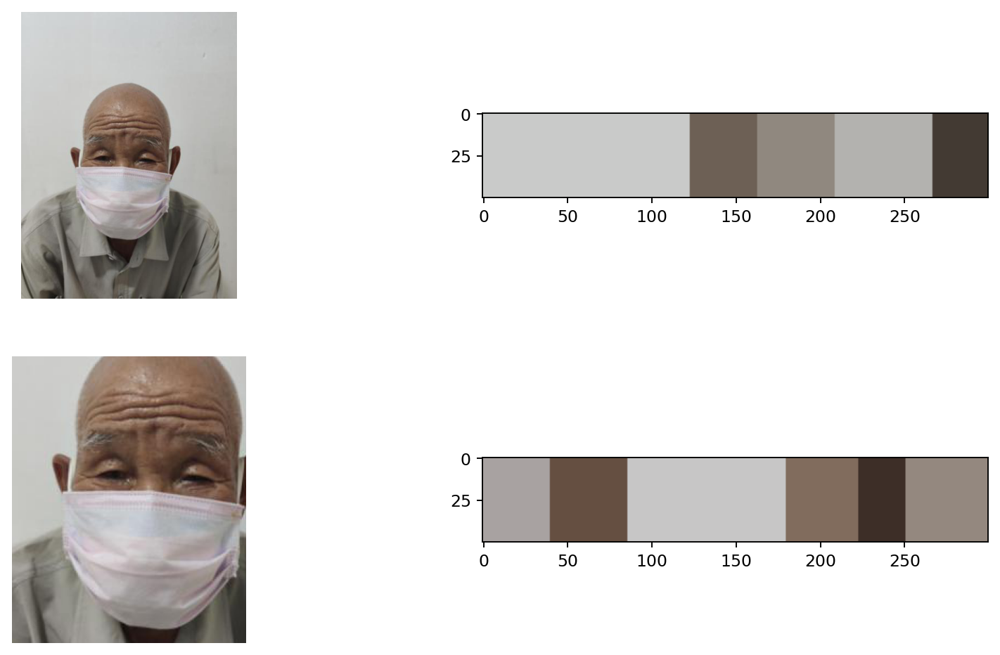

In [44]:
def palette_perc(k_cluster):
    width = 300
    palette = np.zeros((50, width, 3), np.uint8)
    
    n_pixels = len(k_cluster.labels_)
    counter = Counter(k_cluster.labels_)
    perc = {}
    for i in counter:
        perc[i] = np.round(counter[i]/n_pixels, 2)
    perc = dict(sorted(perc.items()))
    
#     print(perc)
#     print(k_cluster.cluster_centers_)
    
    step = 0
    
    for idx, centers in enumerate(k_cluster.cluster_centers_): 
        palette[:, step:int(step + perc[idx]*width+1), :] = centers
        step += int(perc[idx]*width+1)
        
    return palette


j = random.choice(['incorrect_mask','mask1','mask2','mask3','mask4','mask5','normal'])

path = np.random.permutation(train_df.path)[0]
img = Image.open('../P1/train/train/images/' + path + '/' + j +'.jpg')
print(img.size)

crop_img = img.crop([50,150,270,420])
print(crop_img.size)

img = np.array(img)
crop_img = np.array(crop_img)

# print(img)
# print(clt)
# print(clt1)
# print(palette_perc(clt1)[0])
# print(palette_perc(clt2)[0])

fig, ax = plt.subplots(2, 2, figsize=(12, 7), dpi=170)
ax[0, 0].axis('off')
ax[0, 0].imshow(img)
clt = KMeans(n_clusters=5)
clt1 = clt.fit(img.reshape(-1, 3))
ax[0, 1].imshow(palette_perc(clt1))

ax[1, 0].axis('off')
ax[1, 0].imshow(crop_img)
clt = KMeans(n_clusters=6)
clt2 = clt.fit(crop_img.reshape(-1, 3))
ax[1, 1].imshow(palette_perc(clt2))
